<center><img src="images/planetary_computer_header_800w.png" alt="Planetary Computer"/>
</center>

# Data Ingestion - Microsoft Planetary Computer

---

## Overview

In this notebook, you will ingest Landsat data for use in machine learning. Machine learning tasks often involve a lot of data, and in Python, data is typically stored in memory as simple [NumPy](https://foundations.projectpythia.org/core/numpy.html) arrays. However, higher-level containers built on top of NumPy arrays provide more functionality for multidimensional gridded data ([xarray](http://xarray.pydata.org)) or out-of-core and distributed data ([Dask](http://dask.pydata.org)). Our goal for data ingestion will be to load specific Landsat data of interest into one of these higher-level containers.

Earth science datasets are often stored on remote servers that may be too large to download locally. Therefore, in this cookbook, we will focus primarily on ingestion approaches that load small portions of data from a remote source, as needed. The approach for your own work will depend not only on data size and location, but also the intended analysis.

[Microsoft Plantery Computer](https://planetarycomputer.microsoft.com/docs/overview/about) is one of several providers of [Landsat Data](https://planetarycomputer.microsoft.com/dataset/group/landsat). We are using it together with [pystac-client](https://pystac-client.readthedocs.io/en/stable/index.html) and [odc-stac](https://odc-stac.readthedocs.io/en/latest/index.html) because together they provide a nice Python API for searching and loading with specific criteria such as spatial area, datetime, Landsat mission, and cloud coverage.

## Prerequisites

| Concepts | Importance | Notes |
| --- | --- | --- |
| [Intro to Landsat](./00_Intro_Landsat.ipynb) | Necessary | Background |
| [About the Microsoft Planetary Computer](https://planetarycomputer.microsoft.com/docs/overview/about) | Helpful | Background |
| [pystac-client Usage](https://pystac-client.readthedocs.io/en/stable/usage.html) | Helpful | Consult as needed |
| [odc.stac.load Reference](https://odc-stac.readthedocs.io/en/latest/_api/odc.stac.load.html) | Helpful | Consult as needed |
| [xarray](https://foundations.projectpythia.org/core/xarray.html) | Necessary |  |
| [Intro to Dask Array](https://docs.dask.org/en/stable/array.html) | Helpful | |
| [Panel Getting Started Guide](https://panel.holoviz.org/getting_started/build_app.html) | Helpful | |

- **Time to learn**: 10 minutes

## Imports

In [1]:
# Data
import odc.stac
import pandas as pd
import planetary_computer
import pystac_client
import xarray as xr
from pystac.extensions.eo import EOExtension as eo

# Viz
import hvplot.xarray
import panel as pn

pn.extension()

## Open and read the root of the STAC catalog

In [2]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)
catalog.title

'Microsoft Planetary Computer STAC API'

Microsoft Planetary Computer has a public STAC metadata but the actual data assets are in private Azure Blob Storage containers and require authentication. `pystac-client` provides a `modifier` keyword that we can use to manually sign the item. Otherwise, we'd get an error when trying to access the asset.

# Search for Landsat Data

Let's say that an analysis we want to run requires landsat data over a specific region and from a specific time period. We can use our catalog to search for assets that fit our search criteria.

First, let's find the name of the landsat dataset. [This page](https://planetarycomputer.microsoft.com/catalog) is a nice resource for browsing the available collections, but we can also just search the catalog for 'landsat':

In [3]:
all_collections = [i.id for i in catalog.get_collections()]
landsat_collections = [
    collection for collection in all_collections if "landsat" in collection
]
landsat_collections

['landsat-8-c2-l2', 'landsat-c2-l2', 'landsat-c2-l1']

We'll use the `landsat-c2-l2` dataset, which stands for Collection 2 Level-2. It contains data from several landsat missions and has better data quality than Level 1 (`landsat-c2-l1`). Microsoft Planetary Computer has descriptions of [Level 1](https://planetarycomputer.microsoft.com/dataset/landsat-c2-l1) and [Level 2](https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2), but a direct and succinct comparison can be found in [this community post](https://gis.stackexchange.com/questions/439767/landsat-collections), and the information can be verified with [USGS](https://www.usgs.gov/landsat-missions/landsat-collection-2).

Now, let's set our search parameters. You may already know the bounding box (region/area of interest) coordinates, but if you don't, there are many useful tools like [bboxfinder.com](http://bboxfinder.com/) that can help.

In [4]:
bbox = [-118.89, 38.54, -118.57, 38.84]  # Region over a lake in Nevada, USA
datetime = "2017-06-01/2017-09-30"  # Summer months of 2017
collection = "landsat-c2-l2"

We can also specify other parameters in the query, such as a specific landsat mission and the max percent of cloud cover:

In [5]:
platform = "landsat-8"
cloudy_less_than = 1  # percent

Now we run the search and list the results:

In [6]:
search = catalog.search(
    collections=["landsat-c2-l2"],
    bbox=bbox,
    datetime=datetime,
    query={"eo:cloud_cover": {"lt": cloudy_less_than}, "platform": {"in": [platform]}},
)
items = search.get_all_items()
print(f"Returned {len(items)} Items:")
item_id = {(i, item.id): i for i, item in enumerate(items)}
item_id

Returned 3 Items:


{(0, 'LC08_L2SP_042033_20170718_02_T1'): 0,
 (1, 'LC08_L2SP_042033_20170702_02_T1'): 1,
 (2, 'LC08_L2SP_042033_20170616_02_T1'): 2}

It looks like there were three image stacks taken by Landsat 8 over this spatial region during the summer months of 2017 that has less than 1 percent cloud cover.

## Preview Results and Select a Dataset

Before loading one of the available image stacks, it would be useful to get a visual check of the results. Many datasets have a rendered preview or thumbnail image that can be accessed without having to load the full resolution data.

We can create a simple interactive application using the [Panel](https://panel.holoviz.org/index.html) library to access and display rendered PNG previews of the our search results. Note that these pre-rendered images are of large tiles that span beyond our bounding box of interest. In the next steps, we will only be loading in a small area around the lake.

Row
    [0] Select(name='item', options={(0, 'LC08_L2SP_042033_201...}, value=1)
    [1] ParamFunction(function)
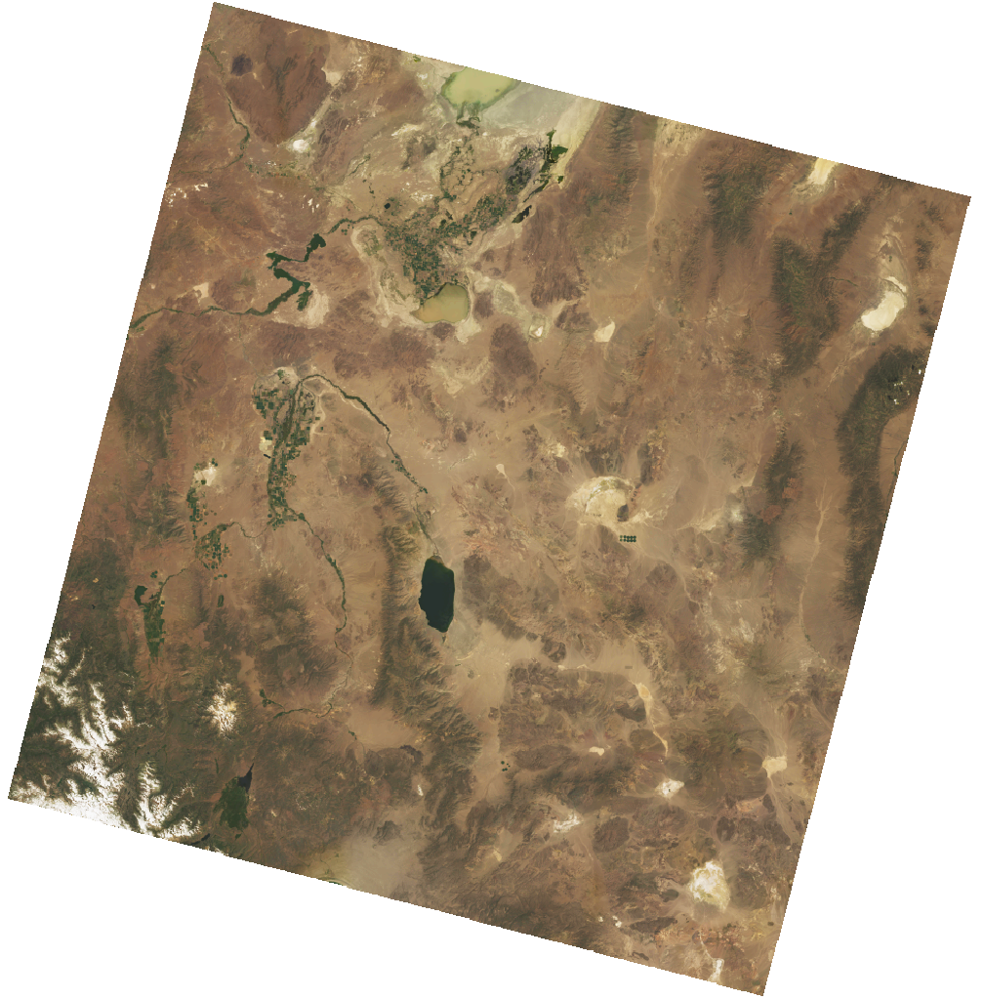

In [7]:
item_sel = pn.widgets.Select(value=1, options=item_id, name="item")


def get_preview(i):
    return pn.panel(items[i].assets["rendered_preview"].href, height=300)


pn.Row(item_sel, pn.bind(get_preview, item_sel))

In [8]:
selected_item = items[1]
selected_item

ID: LC08_L2SP_042033_20170702_02_T1
"Bounding Box: [-119.96969034, 37.80133495, -117.22029446, 39.98317505]"
Datetime: 2017-07-02 18:33:06.200763+00:00
gsd: 30
created: 2022-05-06T17:46:34.110946Z
sci:doi: 10.5066/P9OGBGM6
datetime: 2017-07-02T18:33:06.200763Z
platform: landsat-8
proj:epsg: 32611
"proj:shape: [7941, 7811]"
description: Landsat Collection 2 Level-2


## Access the Data

Now that we have selected a dataset from our catalog, we can procede to access the data. We want to be very selective about the data that we read and when we read it because the amount of downloaded data can quickly get out of hand. Therefore, let's select only a subset of images.

First, we'll preview the different image assets (or [Bands](https://github.com/stac-extensions/eo)) available in the Landsat item.

In [9]:
assets = []
for _, asset in selected_item.assets.items():
    try:
        assets.append(asset.extra_fields["eo:bands"][0])
    except:
        pass

cols_ordered = [
    "common_name",
    "description",
    "name",
    "center_wavelength",
    "full_width_half_max",
]
bands = pd.DataFrame.from_dict(assets)[cols_ordered]
bands

,common_name,description,name,center_wavelength,full_width_half_max
0,red,Visible red,OLI_B4,0.65,0.04
1,blue,Visible blue,OLI_B2,0.48,0.06
2,green,Visible green,OLI_B3,0.56,0.06
3,nir08,Near infrared,OLI_B5,0.87,0.03
4,lwir11,Long-wave infrared,TIRS_B10,10.90,0.59
5,swir16,Short-wave infrared,OLI_B6,1.61,0.09
6,swir22,Short-wave infrared,OLI_B7,2.20,0.19
7,coastal,Coastal/Aerosol,OLI_B1,0.44,0.02


Then we will select a few bands (images) of interest:

In [10]:
bands_of_interest = ["red", "green", "blue"]

Finally, we lazily load the selected data. We will use the package called `odc` which allows us to load only a specific region of interest (bounding box or 'bbox') and specific bands (images) of interest. We will also use the `chunks` argument to load the data as dask arrays; this will load the metadata now and delay the loading until we actually use the data, or until we force the data to be loaded by using `.compute()`.

In [11]:
ds = odc.stac.stac_load(
    [selected_item],
    bands=bands_of_interest,
    bbox=bbox,
    chunks={},  # <-- use Dask
).isel(time=0)
ds

<xarray.Dataset>
Dimensions:      (y: 1128, x: 949)
Coordinates:
  * y            (y) float64 4.301e+06 4.301e+06 ... 4.267e+06 4.267e+06
  * x            (x) float64 3.353e+05 3.353e+05 ... 3.637e+05 3.637e+05
    spatial_ref  int32 32611
    time         datetime64[ns] 2017-07-02T18:33:06.200763
Data variables:
    red          (y, x) uint16 dask.array<chunksize=(1128, 949), meta=np.ndarray>
    green        (y, x) uint16 dask.array<chunksize=(1128, 949), meta=np.ndarray>
    blue         (y, x) uint16 dask.array<chunksize=(1128, 949), meta=np.ndarray>

Let's combine the bands of the dataset into a single DataArray that has the band names as coordinates of a new 'band' dimension, and also call `.compute()` to finally load the data.

In [12]:
da = ds.to_array(dim="band").compute()
da

<xarray.DataArray (band: 3, y: 1128, x: 949)>
array([[[14716, 14872, 14841, ..., 15591, 15679, 16422],
        [14691, 14914, 14988, ..., 16202, 16283, 16292],
        [14655, 14859, 14969, ..., 16466, 16272, 16185],
        ...,
        [13925, 13699, 13709, ..., 17673, 17543, 17552],
        [13804, 13561, 13601, ..., 18429, 18311, 18202],
        [13857, 13828, 13858, ..., 19420, 19400, 18942]],

       [[13292, 13447, 13459, ..., 13927, 14161, 14781],
        [13233, 13402, 13565, ..., 14613, 14553, 14658],
        [13291, 13428, 13585, ..., 14737, 14590, 14478],
        ...,
        [12843, 12616, 12596, ..., 16011, 15853, 15845],
        [12720, 12552, 12468, ..., 16458, 16580, 16411],
        [12704, 12644, 12658, ..., 17487, 17351, 16853]],

       [[11612, 11632, 11711, ..., 12399, 12515, 12870],
        [11572, 11629, 11723, ..., 12819, 12857, 12918],
        [11588, 11655, 11721, ..., 12952, 12848, 12792],
        ...,
        [11314, 11185, 11191, ..., 13784, 13685, 13708],
        [11195, 11104, 11045, ..., 14036, 14182, 14031],
        [11125, 11061, 11106, ..., 14801, 14652, 14284]]], dtype=uint16)
Coordinates:
  * y            (y) float64 4.301e+06 4.301e+06 ... 4.267e+06 4.267e+06
  * x            (x) float64 3.353e+05 3.353e+05 ... 3.637e+05 3.637e+05
    spatial_ref  int32 32611
    time         datetime64[ns] 2017-07-02T18:33:06.200763
  * band         (band) object 'red' 'green' 'blue'

## Visualize the data

Often, data ingestion involves quickly visualizing your raw data to get a sense that things are proceeding accordingly. As we have created an array with red, blue, and green bands, we can quickly display a natural color image of the lake using the `.plot.imshow()` function of `xarray`. We'll use the `robust=True` argument because the data values are outside the range of typical RGB images.

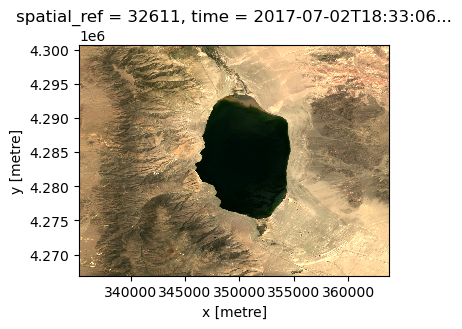

In [13]:
da.plot.imshow(robust=True, size=3)

Now, let's use `hvplot` to provide an interactive visualization of the inividual bands in our array.

In [14]:
da.hvplot.image(x="x", y="y", cmap="greys", aspect=1)

:DynamicMap   [band]
   :Image   [x,y]   (value)

Let's plot the bands as seperate columns by specifying a dimension to expand with `col='band'`. We can also set `rasterize=True` to use [Datashader](https://datashader.org/) (another HoloViz tool) to render large data into a 2D histogram, where every array cell counts the data points falling into that pixel, as set by the resolution of your screen. This is especially important for large and high resolution images that would otherwise cause issues when attempting to render in a browser.

In [15]:
da.hvplot.image(
    x="x", y="y", col="band", cmap="greys", xaxis=False, yaxis=False, colorbar=False, rasterize=True
)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


:GridSpace   [band]
   :DynamicMap   []
      :Image   [x,y]   (value)

Select the zoom tool and zoom in on of the plots to see that all the images are all automatically linked!

## Retain Attributes

Currently, the data is in 'meter' units from a reference point, but we can plot in commonly used longitude, latitude coordinates with `.hvplot(geo=True)` if our array has a valid coordinate reference system (CRS) attribute.

This CRS is referenced by an EPSG code that can be accessed from the metadata of our selected catalog search result. We can see more about this dataset's specific code at [EPSG.io/32611](https://epsg.io/32611). You can also read more about EPSG codes in general in this [Coordinate Reference Systems: EPSG codes](https://pygis.io/docs/d_understand_crs_codes.html#epsg-codes) online book chapter. 

In [16]:
epsg = selected_item.properties["proj:epsg"]
epsg

32611

In [17]:
da.attrs["crs"] = f"epsg:{epsg}"

Now we can use `.hvplot(geo=True)` to plot in longitude and latitude coordinates. Informing `hvPlot` that this is geographic data also allows us to overlay data on aligned geographic tiles using the `tiles` parameter.

In [18]:
da.hvplot.image(
    x="x", y="y", cmap="greys", geo=True, tiles="ESRI", xlabel="Longitude", ylabel="Latitude", colorbar=False, aspect=1,
)

:DynamicMap   [band]
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [x,y]   (value)

## Side-note: Drilling down for data access

As part of accessing data, it's important to understand how to drill down to different representations of our data that certain processing steps might require.

### Xarray DataArray

Earlier, we saw that if the selected data are small enough, we can load into a regular `xarray.DataArray`. This method returns all the data into one in-memory container. Once in an `xarray` object the data can be more easily manipulated and visualized.

In [20]:
da

<xarray.DataArray (band: 3, y: 1128, x: 949)>
array([[[14716, 14872, 14841, ..., 15591, 15679, 16422],
        [14691, 14914, 14988, ..., 16202, 16283, 16292],
        [14655, 14859, 14969, ..., 16466, 16272, 16185],
        ...,
        [13925, 13699, 13709, ..., 17673, 17543, 17552],
        [13804, 13561, 13601, ..., 18429, 18311, 18202],
        [13857, 13828, 13858, ..., 19420, 19400, 18942]],

       [[13292, 13447, 13459, ..., 13927, 14161, 14781],
        [13233, 13402, 13565, ..., 14613, 14553, 14658],
        [13291, 13428, 13585, ..., 14737, 14590, 14478],
        ...,
        [12843, 12616, 12596, ..., 16011, 15853, 15845],
        [12720, 12552, 12468, ..., 16458, 16580, 16411],
        [12704, 12644, 12658, ..., 17487, 17351, 16853]],

       [[11612, 11632, 11711, ..., 12399, 12515, 12870],
        [11572, 11629, 11723, ..., 12819, 12857, 12918],
        [11588, 11655, 11721, ..., 12952, 12848, 12792],
        ...,
        [11314, 11185, 11191, ..., 13784, 13685, 13708],
        [11195, 11104, 11045, ..., 14036, 14182, 14031],
        [11125, 11061, 11106, ..., 14801, 14652, 14284]]], dtype=uint16)
Coordinates:
  * y            (y) float64 4.301e+06 4.301e+06 ... 4.267e+06 4.267e+06
  * x            (x) float64 3.353e+05 3.353e+05 ... 3.637e+05 3.637e+05
    spatial_ref  int32 32611
    time         datetime64[ns] 2017-07-02T18:33:06.200763
  * band         (band) object 'red' 'green' 'blue'
Attributes:
    crs:      epsg:32611

### Numpy Array

Under the hood, this xarray object is essentially comprised of NumPy arrays with the addition of coordinate labels (and [other superpowers](https://docs.xarray.dev/en/latest/getting-started-guide/why-xarray.html)). Sometimes, machine learning tools (e.g. [scikit-learn](https://scikit-learn.org/stable/)) only accept NumPy arrays as input. These arrays are accessible to us from the xarray DataArray objects by using the `.values` attribute.

In [21]:
npa = da.values
type(npa)

numpy.ndarray

In [22]:
npa.shape

(3, 1128, 949)

In [23]:
npa[:3, :3, :3]

array([[[14716, 14872, 14841],
        [14691, 14914, 14988],
        [14655, 14859, 14969]],

       [[13292, 13447, 13459],
        [13233, 13402, 13565],
        [13291, 13428, 13585]],

       [[11612, 11632, 11711],
        [11572, 11629, 11723],
        [11588, 11655, 11721]]], dtype=uint16)

___

## Summary
The data access approach should adapt to features of the data and your intended analysis. As Landsat data is large and multidimensional, a good approach is to use [Microsoft Plantery Computer](https://planetarycomputer.microsoft.com/docs/overview/about), [pystac-client](https://pystac-client.readthedocs.io/en/stable/index.html), and [odc-stac](https://odc-stac.readthedocs.io/en/latest/index.html) together for searching the metadata catalog and lazily loading specific data chunks. Once you have accessed data, visualize it with hvPlot to ensure that it matches your expectations.

### What's next?
Now that we can access data with xarray and Dask, the next step is to select a workflow example and proceed to the analysis.

## Resources and References
- Authored by Demetris Roumis circa Jan, 2023
- Guidance for parts of this notebook was provided by Microsoft in ['Reading Data from the STAC API'](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/)
- The image used in the banner is from [Microsoft](https://ai4edatasetspublicassets.blob.core.windows.net/assets/aod_images/planetary_computer_header_800w.png)

.